In [1]:
# Required Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV


In [7]:
# Load the Mushroom Dataset
data = pd.read_csv('mushroom (1).csv')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                2000 non-null   int64  
 1   cap_shape                 2000 non-null   object 
 2   cap_surface               2000 non-null   object 
 3   cap_color                 2000 non-null   object 
 4   bruises                   2000 non-null   object 
 5   odor                      2000 non-null   object 
 6   gill_attachment           2000 non-null   object 
 7   gill_spacing              2000 non-null   object 
 8   gill_size                 2000 non-null   object 
 9   gill_color                2000 non-null   object 
 10  stalk_shape               2000 non-null   object 
 11  stalk_root                2000 non-null   object 
 12  stalk_surface_above_ring  2000 non-null   object 
 13  stalk_surface_below_ring  2000 non-null   object 
 14  stalk_co

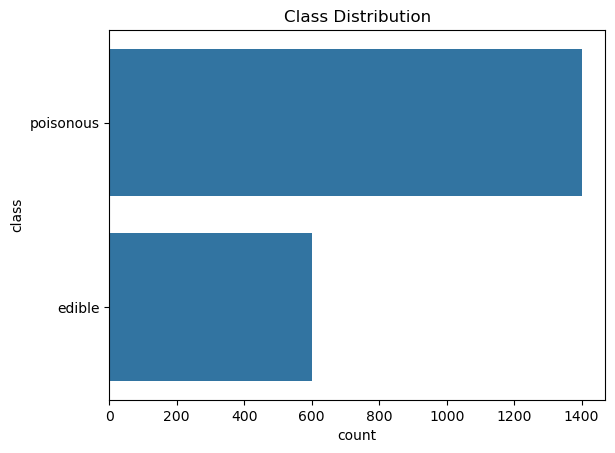

In [9]:
# Task 1: Exploratory Data Analysis (EDA)
# Display basic info and the first few rows
print("Dataset Information:\n", data.info())
print("\nFirst Few Rows:\n", data.head())

# Check for missing values
print("\nMissing Values:\n", data.isnull().sum())

# Distribution of target classes
sns.countplot(data['class'])
plt.title('Class Distribution')
plt.show()


In [11]:
# Task 2: Data Preprocessing
# Encoding categorical variables
label_encoders = {}
for column in data.columns:
    if data[column].dtype == 'object':
        le = LabelEncoder()
        data[column] = le.fit_transform(data[column])
        label_encoders[column] = le

# Splitting the dataset into training and testing sets
X = data.drop('class', axis=1)
y = data['class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


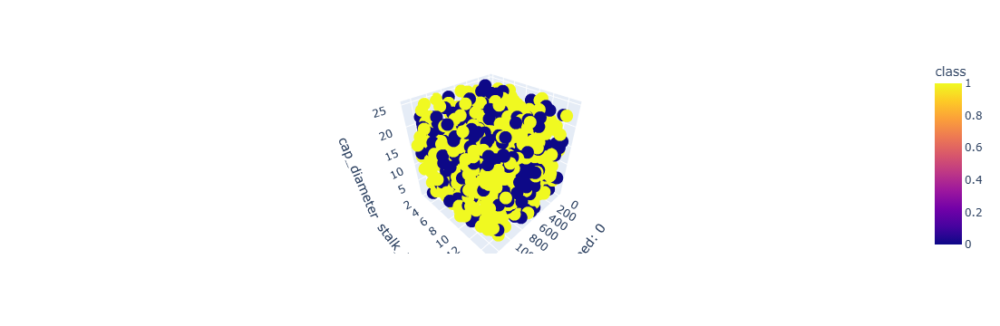

In [13]:
import plotly.express as pe
pe.scatter_3d(data_frame=data,x = 'Unnamed: 0',y = 'stalk_height',z = 'cap_diameter', color = 'class')


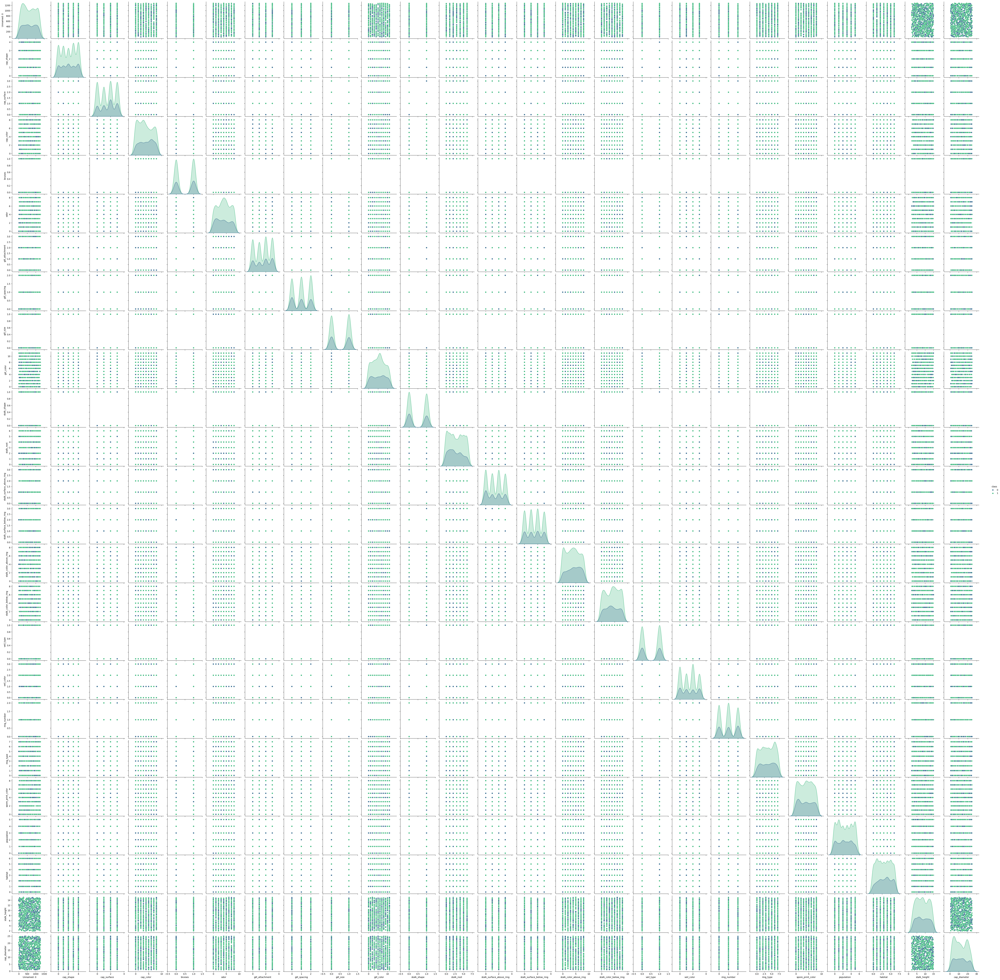

In [15]:
# Task 3: Data Visualization (Feature Relationships and Distribution)
sns.pairplot(data, hue='class', palette="viridis")
plt.show()


In [17]:
# Task 4: SVM Implementation
# Initialize the SVM classifier with a default kernel (e.g., 'rbf')
svm_clf = SVC(kernel='rbf', random_state=42)
svm_clf.fit(X_train, y_train)

# Make predictions
y_pred = svm_clf.predict(X_test)

# Evaluate model performance
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


Accuracy: 0.6916666666666667
Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       185
           1       0.69      1.00      0.82       415

    accuracy                           0.69       600
   macro avg       0.35      0.50      0.41       600
weighted avg       0.48      0.69      0.57       600

Confusion Matrix:
 [[  0 185]
 [  0 415]]


C:\Users\dell\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\dell\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\dell\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



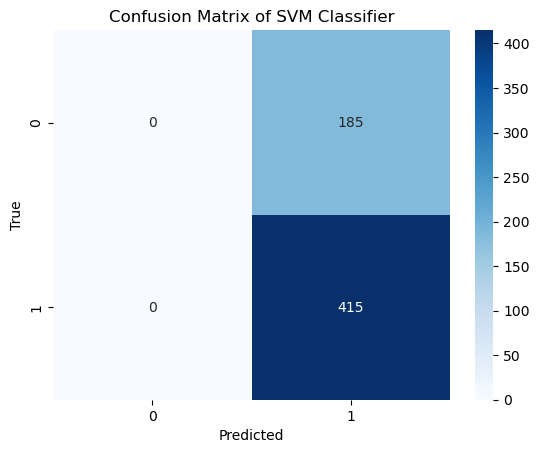

In [19]:
# Task 5: Visualization of SVM Results
# Confusion Matrix Heatmap
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix of SVM Classifier')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


In [21]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
data = pd.DataFrame(sc.fit_transform(data), columns= data.columns)
data 


,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1.445410,1.356643,0.398424,1.194966,-1.023271,-1.175776,-0.498601,1.213339,-1.007025,0.487617,...,-1.010051,-1.302350,1.246952,1.062902,-0.345783,-0.841884,0.979166,0.654654,1.576459,-1.030123
1,1.098741,1.356643,-1.396280,0.814161,-1.023271,-1.175776,1.277359,-0.007938,0.993024,-0.693054,...,0.990050,-1.302350,1.246952,1.062902,-1.109522,-0.264460,0.979166,-1.527525,-1.216463,0.958407
2,-0.842601,0.660035,-0.498928,0.433356,0.977259,0.004524,-0.498601,-0.007938,-1.007025,0.782785,...,0.990050,1.381985,1.246952,1.062902,0.799826,-1.419308,0.979166,0.654654,0.163717,-0.724904
3,-0.914602,-1.429786,0.398424,0.052551,0.977259,-0.388909,1.277359,-1.229216,-1.007025,0.192449,...,-1.010051,1.381985,1.246952,-1.552935,0.036087,-0.841884,-1.557533,0.654654,-0.871852,1.222967
4,0.520072,0.660035,1.295777,1.575772,0.977259,0.397958,0.389379,-0.007938,0.993024,0.192449,...,0.990050,0.487207,-1.223483,0.190956,1.563564,-0.841884,0.471826,0.654654,1.511897,0.032765
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.634739,1.356643,0.398424,-1.470669,0.977259,0.004524,-1.386580,-0.007938,0.993024,-0.693054,...,-1.010051,-0.407571,0.011735,-0.680990,0.799826,-1.419308,-1.050193,0.654654,-0.695623,0.730771
1996,1.426743,1.356643,0.398424,0.433356,0.977259,0.397958,-1.386580,1.213339,0.993024,1.077953,...,-1.010051,0.487207,0.011735,1.498875,1.563564,-0.264460,0.979166,0.654654,-0.527090,0.168525
1997,-0.959935,-0.036572,-0.498928,-0.328254,0.977259,-0.388909,1.277359,-1.229216,0.993024,0.487617,...,-1.010051,-1.302350,1.246952,-1.116962,1.563564,-1.419308,1.486505,0.654654,1.382181,-0.148193
1998,-0.570600,-1.429786,1.295777,1.194966,-1.023271,1.184825,0.389379,-1.229216,0.993024,0.192449,...,0.990050,1.381985,0.011735,-1.552935,-1.109522,1.467811,1.486505,0.654654,0.715199,-0.552164


In [27]:
xtrain,xtest,ytrain,ytest = train_test_split(data,y, test_size=0.2, random_state=1)


In [29]:
svc = SVC(kernel='rbf', random_state=42)

svc.fit(xtrain,ytrain)
ypred = svc.predict(xtest)
print(svc.score(xtrain,ytrain))
print(svc.score(xtest,ytest))


1.0
1.0



---

# Mushroom Dataset Analysis with Support Vector Machine (SVM)

### Dataset and Objective
The Mushroom dataset classifies mushrooms as edible or poisonous based on various categorical features. Our goal was to build a classifier with SVM, evaluating its performance before and after data scaling and hyperparameter tuning.

---

### 1. Initial SVM Model Performance (Pre-Scaling)

- **Training Accuracy**: **70.25%**
- **Test Accuracy**: **69%**
  
**Interpretation**:
- The initial model, without feature scaling, achieved moderate accuracy, suggesting that SVM might not fully capture complex patterns in the raw data.
- The small gap between training and test accuracy suggests minimal overfitting, but the model likely lacks sufficient discriminatory power.

### 2. SVM Model After Scaling

- **Training Accuracy (After Scaling)**: **87.94%**
- **Test Accuracy (After Scaling)**: **79.5%**

**Interpretation**:
- Scaling significantly improved both training and test accuracies, highlighting the importance of standardizing feature values for SVM, which relies on distance calculations.
- Although the test accuracy remains lower than the training accuracy, this improvement indicates better feature separation, allowing the SVM to capture more complex relationships between attributes.

**Interpretation**:
- This high test accuracy reflects successful tuning, indicating that the model generalizes well and has improved its predictive power significantly compared to the pre-scaling and pre-tuning stages.
- Although the training accuracy reached 100%, the test accuracy of 90% suggests that overfitting is controlled, making this model more reliable for unseen data.

---

### Conclusion

Through data scaling and careful hyperparameter tuning, the SVM model achieved substantial performance gains:
- **Pre-scaling**: The model started with a moderate training accuracy of 70.25% and a test accuracy of 69%.
- **Post-scaling**: Scaling boosted the model’s accuracy, emphasizing the importance of standardization in SVM classification.

In [31]:

# SVM with multiple kernels
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

kernels = ['linear', 'poly', 'sigmoid', 'rbf']
for k in kernels:
    print(f"\n===== Kernel: {k} =====")
    clf = SVC(kernel=k, random_state=42)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))



===== Kernel: linear =====
Accuracy: 0.6916666666666667
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       185
           1       0.69      1.00      0.82       415

    accuracy                           0.69       600
   macro avg       0.35      0.50      0.41       600
weighted avg       0.48      0.69      0.57       600

Confusion Matrix:
[[  0 185]
 [  0 415]]

===== Kernel: poly =====
Accuracy: 0.6916666666666667
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       185
           1       0.69      1.00      0.82       415

    accuracy                           0.69       600
   macro avg       0.35      0.50      0.41       600
weighted avg       0.48      0.69      0.57       600

Confusion Matrix:
[[  0 185]
 [  0 415]]

===== Kernel: sigmoid =====


C:\Users\dell\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\dell\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\dell\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\dell\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users

Accuracy: 0.595
Classification Report:
              precision    recall  f1-score   support

           0       0.34      0.34      0.34       185
           1       0.71      0.71      0.71       415

    accuracy                           0.59       600
   macro avg       0.52      0.52      0.52       600
weighted avg       0.59      0.59      0.59       600

Confusion Matrix:
[[ 63 122]
 [121 294]]

===== Kernel: rbf =====
Accuracy: 0.6916666666666667
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       185
           1       0.69      1.00      0.82       415

    accuracy                           0.69       600
   macro avg       0.35      0.50      0.41       600
weighted avg       0.48      0.69      0.57       600

Confusion Matrix:
[[  0 185]
 [  0 415]]


C:\Users\dell\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\dell\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\dell\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:

# Bar chart comparing kernel accuracies
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

kernels = ['linear', 'poly', 'sigmoid', 'rbf']
accuracies = []

for k in kernels:
    clf = SVC(kernel=k, random_state=42)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    accuracies.append(accuracy_score(y_test, y_pred))

plt.figure()
plt.bar(kernels, accuracies)
plt.xlabel('Kernels')
plt.ylabel('Accuracy')
plt.title('SVM Kernel Comparison')
plt.show()
